# Supervised learning lab day 1


## Exercise 1:

Adapt the code from the **Day1-Block2-Notebook1** to train a logistic regression and a perceptron classifier on the new data set below.

This data set contains person-level data from a digitized image of a fine needle aspirate of a breast mass for people with suspected breast cancer. Researchers then measured 11 features of the image. The aim is to predict patient diagnosis. Features of the dataset are:

   -- -----------------------------------------
   1. Sample code number            id number
   2. Clump Thickness               1 - 10
   3. Uniformity of Cell Size       1 - 10
   4. Uniformity of Cell Shape      1 - 10
   5. Marginal Adhesion             1 - 10
   6. Single Epithelial Cell Size   1 - 10
   7. Bare Nuclei                   1 - 10
   8. Bland Chromatin               1 - 10
   9. Normal Nucleoli               1 - 10
  10. Mitoses                       1 - 10
  11. Class:                        (2 for benign, 4 for malignant)

More details of the dataset are available at: https://archive-beta.ics.uci.edu/ml/datasets/breast+cancer+wisconsin+diagnostic

**Questions (add your answers below each question):**

2.1 How many classes are you trying to predict?
**2 - benign or malignant, denoted by 2 or 4 in the output label**

2.2 Using a train/test split of 70/30, calculate the mean and standard deviation of each feature that will be used in the standard scalar?

2.3 What is the sensitivity and specificity of your classifiers?

2.4 [optional] For the logistic regression, vary the decision threshold to generate an ROC curve. 
- What is the sensitivity when the threshold is 0? 
- What is the sensitivity when the threshold is 1?
- If we want our classifier, a priori, to have a sensitivity of 95%, what is the corresponding specifity?

When the threshold is 0: The classifier predicts all instances as positive, regardless of their actual probabilities. Hence, sensitivity is 100% because all true positives are identified, but specificity is 0% because no true negatives are identified.

When the threshold is 1: The classifier predicts all instances as negative, because the predicted probability is never exactly 1 due to the nature of logistic regression outputs. Hence, sensitivity is 0% because no positives are identified, while specificity is 100% because all negatives are correctly identified.

# Data Import 

In [1]:
# data import 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport

data = pd.read_csv('breast-cancer-wisconsin.csv', header = None, na_values='?')
data.head()

,0,1,2,3,4,5,6,7,8,9,10
0,1000025,5,1,1,1,2,1.0,3,1,1,2
1,1002945,5,4,4,5,7,10.0,3,2,1,2
2,1015425,3,1,1,1,2,2.0,3,1,1,2
3,1016277,6,8,8,1,3,4.0,3,7,1,2
4,1017023,4,1,1,3,2,1.0,3,1,1,2


In [2]:
profile = ProfileReport(data.copy(), title="Profiling Report")
profile.to_notebook_iframe() # Writes the report in the notebook
#profile.to_file(output_file='output.html') # This creates and html file with the report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
# separate the features from the labels
y = data.iloc[:,10]
X = data.iloc[:,1:10]
X.head()

,1,2,3,4,5,6,7,8,9
0,5,1,1,1,2,1.0,3,1,1
1,5,4,4,5,7,10.0,3,2,1
2,3,1,1,1,2,2.0,3,1,1
3,6,8,8,1,3,4.0,3,7,1
4,4,1,1,3,2,1.0,3,1,1


In [4]:
X.mode()
# Why Use .iloc[0] for Imputation?
# Guarantees a Consistent Shape
# Simplifies Decision Making

,1,2,3,4,5,6,7,8,9
0,1,1,1,1,2,1.0,2,1,1


In [5]:
# Imputation

In [6]:
 X.isna().sum()

1     0
2     0
3     0
4     0
5     0
6    16
7     0
8     0
9     0
dtype: int64

In [7]:
cols = [6]
X[cols]=X[cols].fillna(X.mode().iloc[0]) # iloc[0] making it a series

In [8]:
 X.isna().sum()

1    0
2    0
3    0
4    0
5    0
6    0
7    0
8    0
9    0
dtype: int64

In [9]:
#impute missing data - Another way to do it
#from sklearn.impute import SimpleImputer
#imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
#imp_mean.fit(X_train)
#X_train = imp_mean.transform(X_train)


In [10]:
#split into training and testing
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [11]:
#Normalise
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)
type(X_train)

numpy.ndarray

In [12]:
scaler.mean_ #show the means for each column

array([4.30879346, 3.12269939, 3.1799591 , 2.80572597, 3.18813906,
       3.47239264, 3.42944785, 2.83026585, 1.63599182])

In [13]:
scaler.var_ #show the variances for each column

array([ 8.24615989,  9.36326797,  8.83878037,  8.37330055,  5.0034585 ,
       13.26355276,  5.97508374,  9.08570975,  3.34807064])

In [14]:
# Just to check the normalisation

In [15]:
np.mean(X_train,axis=0)

array([ 4.35915789e-17, -1.23509473e-16, -6.90199999e-17, -8.35505262e-17,
        2.54284210e-17, -3.26936842e-17, -5.99384210e-17, -1.81631579e-18,
       -1.08978947e-17])

In [16]:
np.std(X_train,axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [17]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(max_iter=10000)
logreg.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [18]:
score = logreg.score(X_test,y_test)
print(score)

0.9619047619047619


In [19]:
from sklearn.metrics import classification_report, RocCurveDisplay
import matplotlib.pyplot as plt
%matplotlib inline
# Predicted labels
y_pred = logreg.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           2       0.98      0.96      0.97       136
           4       0.92      0.97      0.95        74

    accuracy                           0.96       210
   macro avg       0.95      0.96      0.96       210
weighted avg       0.96      0.96      0.96       210



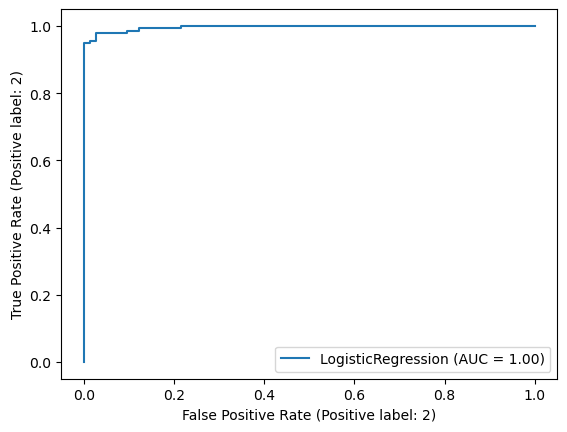

In [20]:
# Predicted probabilities
y_probs = logreg.predict_proba(X_test)

# Plot ROC curve
RocCurveDisplay.from_estimator(logreg, X_test, y_test, pos_label=2)
plt.show() 

In [21]:
from sklearn import metrics
cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

# Extracting the values from the confusion matrix
TN, FP, FN, TP = cm.ravel()

# Calculate Sensitivity and Specificity
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)

print(f"Sensitivity (Recall/True Positive Rate): {sensitivity}")
print(f"Specificity (True Negative Rate): {specificity}")


[[130   6]
 [  2  72]]
Sensitivity (Recall/True Positive Rate): 0.972972972972973
Specificity (True Negative Rate): 0.9558823529411765


In [22]:
# binary classification, recall of the positive class is also known as “sensitivity”; recall of the negative class is “specificity”.
# Precision = TP / TP + FP   Recall = Sensitivity = TP / TP + FN  specificity = TN / TN + FP

In [23]:
## ROC analysis
#y_probs = logreg.predict_proba(X_test)

#from sklearn.metrics import plot_roc_curve
#plot_roc_curve(logreg, X_test, y_test) 

In [24]:
from sklearn.metrics import roc_curve

# Assuming y_probs is the probability of the positive class
y_probs_pos = logreg.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_probs_pos, pos_label=2)

# Convert FPR to Specificity: Specificity = 1 - FPR
specificity_scores = 1 - fpr

# Find the threshold closest to a sensitivity of 95%
index = np.where(tpr >= 0.95)[0][0]  # Get the first index where sensitivity >= 95%
specificity_at_95_sensitivity = specificity_scores[index]

print(f"Specificity corresponding to a sensitivity of 95%: {specificity_at_95_sensitivity}")


Specificity corresponding to a sensitivity of 95%: 0.0



## Exercise 2 (optional):
By adapting the code from **Day1-Block2-Notebook2**, consider the following:

1.1 Generate noisy, simulated data for a model where an input  𝑇  gives output  𝑍  via the relationship,  𝑍=𝑐sin(𝑇+𝑑) . (use c=0.5 and d=-0.25.). **Plot *Z* vs *T* **


1.2 Next, using your simulated data, write a stochastic gradient descent procedure to learn the parameters  (𝑐,𝑑)  from the simulated values of  (𝑇,𝑍) and **Plot the training loss over multiple steps**

In [25]:
### This is for you to attempt and have a go. As you will notice the model for data generation is different than in case of practice notebook. 
### You can adapt the code from practice notebook and play around with the parameters, the range of the independant variable (T), noise variance etc. 
### Similarly you can try simple linear model as in case of practice notebook but can also think of different strategies. 

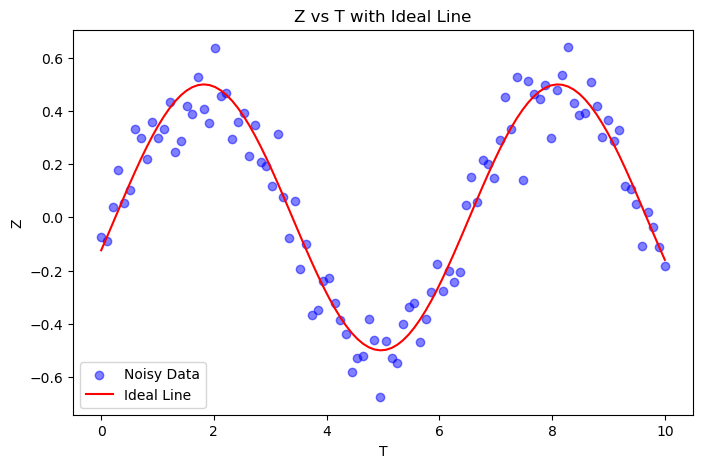

In [30]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt

# Parameters
c = 0.5
d = -0.25

# Generate simulated data
np.random.seed(42)  # For reproducibility
T = np.linspace(0, 10, 100)  # 100 points from 0 to 10
Z_noisy = c * np.sin(T + d) + np.random.normal(0, 0.1, T.shape)  # Adding Gaussian noise
Z_ideal = c * np.sin(T + d)  # Ideal line without noise

# Plot Z vs T
plt.figure(figsize=(8, 5))
plt.scatter(T, Z_noisy, color='blue', alpha=0.5, label='Noisy Data')
plt.plot(T, Z_ideal, color='red', label='Ideal Line')
plt.title('Z vs T with Ideal Line')
plt.xlabel('T')
plt.ylabel('Z')
plt.legend()
plt.show()


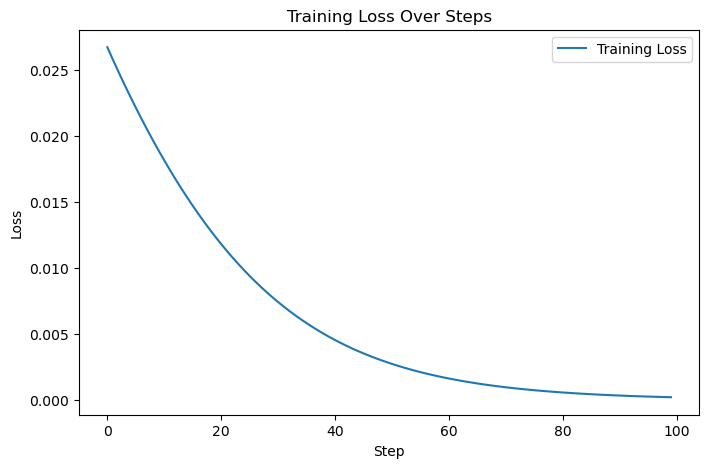

In [31]:
def sgd_step(c, d, T, Z, lr=0.01):
    """Performs a single SGD step and returns updated c, d, and loss."""
    # Predictions
    Z_pred = c * np.sin(T + d)
    
    # Compute gradients
    grad_c = -2 * np.sum((Z - Z_pred) * np.sin(T + d))
    grad_d = -2 * np.sum((Z - Z_pred) * c * np.cos(T + d))
    
    # Update parameters
    c -= lr * grad_c
    d -= lr * grad_d
    
    # Compute loss
    loss = np.mean((Z - Z_pred)**2)
    
    return c, d, loss

# Initial parameters
c_init = np.random.rand()
d_init = np.random.rand()

# Learning rate
lr = 0.001

# Number of iterations
iterations = 100

# Store loss
losses = []

# SGD loop
c, d = c_init, d_init
for i in range(iterations):
    c, d, loss = sgd_step(c, d, T, Z_ideal, lr)
    losses.append(loss)

# Plotting the training loss
plt.figure(figsize=(8, 5))
plt.plot(losses, label='Training Loss')
plt.title('Training Loss Over Steps')
plt.xlabel('Step')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [30]:
c

0.417411003148779

In [31]:
d

0.22210781047073025